In [1]:
from collections import defaultdict
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import sklearn
# Use Jaccard distance from this package
# Recall Jaccard_dist(A,B) = 1-Jaccard_similarity(A, B) 
import scipy.spatial.distance as spdist

import ihop
from ihop.community2vec import GensimCommunity2Vec
import ihop.clustering as ic

sns.set_palette("Dark2")
print(sns.color_palette("Dark2").as_hex())

['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e', '#e6ab02', '#a6761d', '#666666']


In [2]:

DATA_ROOT = Path("../data")
C2V_ROOT = DATA_ROOT / "community2vec"
VIZ_PATH = DATA_ROOT / "community2vec_nearest_neighbor_visuals"

if not VIZ_PATH.exists():
    VIZ_PATH.mkdir()

MONTHS = sorted(["2021-04", "2021-05", "2021-06", "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-12", "2022-01", "2022-02", "2022-03"
])

C2V_MODELS = [GensimCommunity2Vec.load(C2V_ROOT / f"RC_{m}"/"best_model") for m in MONTHS]

SUBREDDIT_COUNTS_CSVS = [C2V_ROOT / f"RC_{m}" / "subreddit_counts.csv" for m in MONTHS]

In [3]:
def get_jaccard_similarity(set1, set2):
    intersection_size = len(set1.intersection(set2))
    if intersection_size == 0: 
        return 0
    union_size = len(set1.union(set2))
    return intersection_size / union_size


# Basic Inter-month Set Metrics
Determine which subreddits appear in EVERY MONTH in the dataset.

In [4]:
year_union = set()
year_intersection = set(C2V_MODELS[0].get_index_to_key())
for month_model in C2V_MODELS:
    month_subreddits = set(month_model.get_index_to_key())
    year_union = month_subreddits.union(year_union)
    year_intersection = month_subreddits.intersection(year_intersection)
print("Size of union over all months:", len(year_union))
print("Size of intersection over all months:", len(year_intersection))

Size of union over all months: 15292
Size of intersection over all months: 6950


In [5]:
# Some examples of the subreddits which appear in every month
for i, s in enumerate(year_intersection):
    print(s)
    if i>10:break

hinduism
CrucibleGuidebook
canucks
BPDlovedones
Paleontology
ethereum
German
NorthCarolina
chickens
The_Crew
suicidebywords
awfuleverything


# Measure the overall trends of nearest neighbor change and outlier detection
We'd like to know on average how much a subreddit's nearest neighbors change from one month to the next. Here we will fix the number of nearest neighbors to examine, then examine how each subreddits' neighbors change in adjacent months using Jaccard Similarity. We also use outlier detection to examine which subreddits are appear in dense sections of the embedding space, to see how that may relate to whether or not its nearest neighbors shift significantly.

In [6]:
k_nearest_neighbors = 20
similarity_tracking_df = pd.DataFrame(data={"subreddit":list(year_intersection)})
js_lof_association_matrix = np.empty((0,3))
jaccard_sim_cols = []
lof_cols=[]
prev_month=None

for month, c2v_model in zip(MONTHS, C2V_MODELS):
    this_month_nn_col = f"{month} {k_nearest_neighbors} nearest subreddits"
    similarity_tracking_df[this_month_nn_col] = similarity_tracking_df["subreddit"].apply(lambda x: set(c2v_model.get_nearest_neighbors(x, topn=k_nearest_neighbors)))

    # Local outlier factors: this didn't turn out to be interesting
    #lof_month_col = f"{month} local outlier factor"
    # Compute outlier scores for this month's snapshot
    #lof_clf = sklearn.neighbors.LocalOutlierFactor(n_neighbors = 20, metric="cosine", n_jobs=-1)
    #outlier_scores = lof_clf.fit_predict(c2v_model.get_normed_vectors())

    # Add subreddit's outlier score to dataframe
    #subreddit_indices = c2v_model.get_index_to_key()
    #similarity_tracking_df[lof_month_col] = similarity_tracking_df["subreddit"].apply(lambda x: outlier_scores[subreddit_indices.index(x)])

    #lof_cols.append(lof_month_col)

    if prev_month is not None:
        prev_month_nn_col = f"{prev_month} {k_nearest_neighbors} nearest subreddits"
        prev_month_lof_col = f"{prev_month} local outlier factor"
        js_col_name = f"{month} vs {prev_month} Jaccard Similiarity"
        lof_pairwise_col_name = f"{month} vs {prev_month} avg Local Outlier Factor"

        def js_with_specific_cols(row):
            return get_jaccard_similarity(
                row[this_month_nn_col], 
                row[prev_month_nn_col])

        similarity_tracking_df[js_col_name] = similarity_tracking_df.apply(js_with_specific_cols, axis=1)
        jaccard_sim_cols.append(js_col_name)

        # More local outlier factor stuff
        #similarity_tracking_df[lof_pairwise_col_name] = similarity_tracking_df[[lof_month_col, prev_month_lof_col]].mean(axis=1)
        #js_lof_association_matrix = np.concatenate([js_lof_association_matrix, similarity_tracking_df[["subreddit", js_col_name, lof_pairwise_col_name]].to_numpy()], axis=0)


    prev_month=month

In [7]:
# Local Outlier Factor vs. avg nearest neighbors Jaccard Sim
# js_lof_association_df = pd.DataFrame(js_lof_association_matrix, columns=["subreddit", "pairwise month Jaccard Similarity"], "pairwise month average Local Outlier Factor"])
# print(js_lof_association_df.shape)
# display(js_lof_association_df.head())

In [8]:
# g = sns.JointGrid(data = js_lof_association_df, x="pairwise month Jaccard Similarity", y="pairwise month average Local Outlier Factor", marginal_ticks=True, xlim=(0,1))

# cax = g.figure.add_axes([1.0, .55, .02, .2])
# g.plot_joint(
#     sns.histplot,
#     cmap="light:#03012d", pmax=.25, cbar=True, cbar_ax=cax
# )
# g.plot_marginals(sns.histplot, element="step", color="#03012d")

In [9]:
js_avg_col = f"Jaccard Similarity between {k_nearest_neighbors} nearest neighbors of adjacent months averaged over the year"
js_stddev_col = "stddev Jaccard Similarity between adjacent months over the year"
similarity_tracking_df[js_avg_col] = similarity_tracking_df[jaccard_sim_cols].mean(axis=1)

similarity_tracking_df[js_stddev_col] = similarity_tracking_df[jaccard_sim_cols].std(axis=1)

In [10]:
jaccard_similarity_tracking_df = similarity_tracking_df.sort_values(by=[js_avg_col])
jaccard_similarity_tracking_df

,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
2467,CelebbattlePolls,"{ActionFigures, iBUYPOWER, facepalm, myanmar, ...","{holesome, okmatewanker, Im15AndThisIsYeet, di...",0.00000,"{SocialSiganls, iOSBeta, applehelp, google, iP...",0.000000,"{italianlearning, OOTP, eu4, Finanzen, CHICubs...",0.000000,"{SocietyLounge, SamsungUnpacked, pyrocynical, ...",0.00000,...,"{RaceTrackDesigns, TrueFMK, goth, MastersOfThe...",0.000000,"{testicularcancer, Dexcrypto, HomeworkHelp, Po...",0.000000,"{PantiesCraze, FrenchGoneWild, fatherjohnmisty...",0.000000,"{vintageads, ResidentAlienTVshow, Sikh, toriam...",0.000000,0.000000,0.000000
6841,SubSimulatorGPT2,"{GodhoodWB, SocialSiganls, Cult_of_Lex_Nuqui, ...","{MnetKingdom, Miami, rant, RushRoyale, Admiral...",0.00000,"{LibertarianPartyUSA, projectors, AmazonWFShop...",0.000000,"{hogwartswerewolvesB, GodhoodWB, cromunity, se...",0.000000,"{fragilecommunism, internacional, ShitPolitics...",0.00000,...,"{CACovidRentRelief, cromunity, Pocket7Games, M...",0.000000,"{questionablecontent, OzBargainNew, skiing, ku...",0.000000,"{cubancigars, lincoln, TLRY, interactivebroker...",0.000000,"{Cult_of_Lex_Nuqui, cromunity, Jade_Academy, R...",0.000000,0.000000,0.000000
6858,OzBargainNew,"{redneckengineering, spotted, AutoDetailing, s...","{OnlyFansMansion, GxbyMxrtinez, PornSelected, ...",0.00000,"{Columbus, Boobies, JuniorDoctorsUK, Charlotte...",0.000000,"{bigdicklovers, aforismiecitazioni, TwitchGone...",0.000000,"{horizon, 30ROCK, explainlikeimfive, fixit, pi...",0.00000,...,"{WaifusLewd, CalPoly, newsNepal, BrawlRecruit,...",0.000000,"{SeenOnNews_longtail, ipowarriors, Nude_TikTok...",0.000000,"{TheForest, BallBusting, TheOakShack, spiderbr...",0.000000,"{BotTown2, xrptrader, OSHA, VVVVVV, raocflair,...",0.000000,0.000000,0.000000
1399,newsNepal,"{goodanimemes, pyrocynical, ARKone, Teenager_P...","{freefire, charmed, Classical_Liberals, JuiceW...",0.00000,"{okbuddyvowsh, transpositive, ContraPoints, is...",0.000000,"{Autobody, amcstock, yeezys, ConservativeKiwi,...",0.000000,"{awardtravel, Lawyertalk, Oman, Austin, Flight...",0.00000,...,"{quin69, SelfPromotionYouTube, IndieDev, italy...",0.000000,"{WaifusLewd, XYONetwork, torontoraptors, recen...",0.000000,"{AZSwingers, ArizonaSwingers, SALEM, ArizonaGo...",0.000000,"{EDHBrews, airsoftmarket, Bellingham, PowerTri...",0.000000,0.000000,0.000000
4136,viral,"{DenOfDeals, Toys_Best_Deals, ThingsCutInHalfP...","{OnlyFansMansion, Petaardsdegaule, GxbyMxrtine...",0.00000,"{GetMoreViewsYT, Cult_of_Lex_Nuqui, SelfPromot...",0.000000,"{AnimePossession, SaGa_ReuniverSe, TeslaModel3...",0.000000,"{hotclub, PickOne, Mexico_Videos, BlueStarChro...",0.00000,...,"{EnbyLewds, VRchat, Stadia, pansexual, Biconom...",0.000000,"{sistersofbattle, AdeptusMechanicus, darkestdu...",0.000000,"{carscirclejerk, RealTesla, Mechwarrior5, fatF...",0.000000,"{SeenOnNews_longtail, sveopsta, OzBargainNew, ...",0.000000,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2104,readwithme,"{distantsocializing, RedditMasterClasses, TheY...","{distantsocializing, RedditMasterClasses, TheY...",0.73913,"{distantsocializing, RedditMasterClasses, TheY...",0.904762,"{distantsocializing, menga, RedditMasterClasse...",0.818182,"{distantsocializing, R

In [11]:
mean_js = jaccard_similarity_tracking_df[js_avg_col].mean()
stddev_js = jaccard_similarity_tracking_df[js_avg_col].std()
stdev_upper = mean_js + stddev_js
stddev_lower = mean_js - stddev_js
print("Mean", mean_js)
print("1 stddev above", stdev_upper)
print("1 stddev below", stddev_lower)

Mean 0.4357252983675287
1 stddev above 0.5868815064397986
1 stddev below 0.2845690902952588


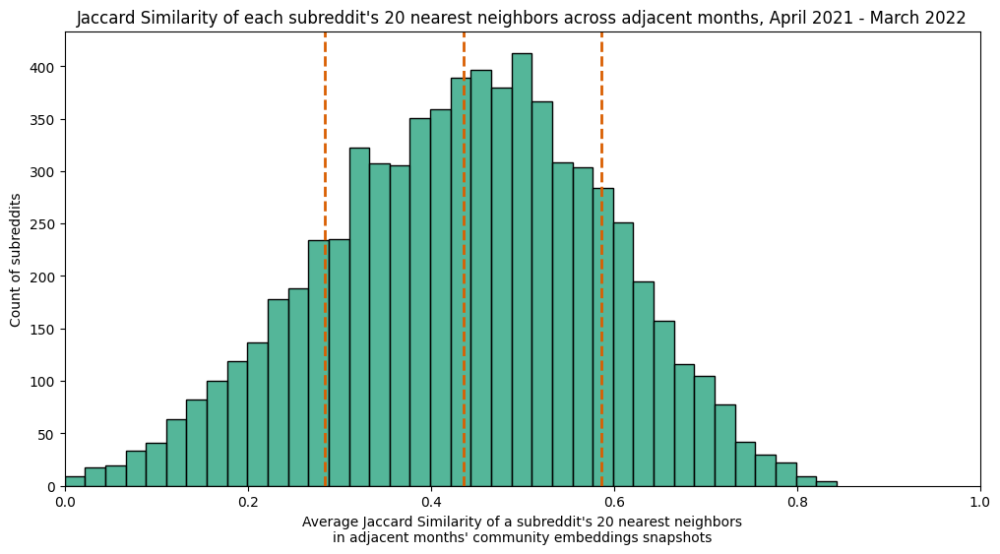

<Figure size 640x480 with 0 Axes>

In [12]:
plt.figure(figsize=(12,6))
ax = sns.histplot(data=jaccard_similarity_tracking_df, x=js_avg_col)
ax.set(ylabel="Count of subreddits", xlabel=f"Average Jaccard Similarity of a subreddit's {k_nearest_neighbors} nearest neighbors\nin adjacent months' community embeddings snapshots", title = f"Jaccard Similarity of each subreddit's {k_nearest_neighbors} nearest neighbors across adjacent months, April 2021 - March 2022")
plt.xlim(0, 1)
plt.axvline(x = mean_js, color="#d95f02", linestyle="--", linewidth=2)
plt.axvline(x = stdev_upper, color="#d95f02", linestyle="--", linewidth=2)
plt.axvline(x = stddev_lower, color="#d95f02", linestyle="--", linewidth=2)

# Manually pull some interesting examples
"""ax.annotate("OzBargainNew\nCelebbattlePolls\nnewsNepal\nSubSimulatorGPT2\nviral", 
           xy=(0.08, 0.25), xycoords="axes fraction", horizontalalignment="center")
ax.annotate("TheArtistStudio\nTheYouShow\nTheGamerLounge", 
             xy=(0.83, 0.15), xycoords="axes fraction", horizontalalignment="center")
ax.annotate("gaming\nfacepalm\nOnePiece\nPokemonGoRaids\nAskWomen", 
            xy=(0.355,0.82), xycoords="axes fraction",  horizontalalignment="center")
ax.annotate("news\nMadeMeSmile\ntodayilearned\ndating_advice\nWhatcouldgowrong", 
            xy=(0.68,0.75), xycoords="axes fraction",  horizontalalignment="center")
 """# TODO Manually put in arrows to histogram bar later
plt.savefig(VIZ_PATH / "jaccard_similarity_histogram.png", bbox_inches="tight")

plt.show()
plt.clf()

In [13]:
# Which are the LEAST stable subreddits in terms of nearest neighbors? 
subreddits_with_lowest_avg_js = jaccard_similarity_tracking_df.head(int(0.1 * len(year_intersection)))
lowest_avg_js_subreddits = list(subreddits_with_lowest_avg_js["subreddit"])
print("Subreddits with lowest avg. Jaccard Similarity:")
for i in range(1, 25):
    j = len(year_intersection) - i + 1 
    print(j, ":", lowest_avg_js_subreddits[i-1])
display(subreddits_with_lowest_avg_js)

Subreddits with lowest avg. Jaccard Similarity:
6950 : CelebbattlePolls
6949 : SubSimulatorGPT2
6948 : OzBargainNew
6947 : newsNepal
6946 : viral
6945 : EmpiresAndPuzzles
6944 : NYr4r
6943 : BaltimoreAndDCr4r
6942 : sherwinwilliams
6941 : RiseofKingdoms
6940 : SexDolls
6939 : GolfClash
6938 : chicagor4r
6937 : SubredditSummaryBot
6936 : hookah
6935 : HeroWarsApp
6934 : BrasilSimulator
6933 : test
6932 : ShadowBan
6931 : GBr4r
6930 : OrnaRPG
6929 : ShoppingDealsOnline
6928 : PickOne
6927 : 8BallPool


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
2467,CelebbattlePolls,"{ActionFigures, iBUYPOWER, facepalm, myanmar, ...","{holesome, okmatewanker, Im15AndThisIsYeet, di...",0.000000,"{SocialSiganls, iOSBeta, applehelp, google, iP...",0.000000,"{italianlearning, OOTP, eu4, Finanzen, CHICubs...",0.000000,"{SocietyLounge, SamsungUnpacked, pyrocynical, ...",0.000000,...,"{RaceTrackDesigns, TrueFMK, goth, MastersOfThe...",0.000000,"{testicularcancer, Dexcrypto, HomeworkHelp, Po...",0.000000,"{PantiesCraze, FrenchGoneWild, fatherjohnmisty...",0.000000,"{vintageads, ResidentAlienTVshow, Sikh, toriam...",0.000000,0.000000,0.000000
6841,SubSimulatorGPT2,"{GodhoodWB, SocialSiganls, Cult_of_Lex_Nuqui, ...","{MnetKingdom, Miami, rant, RushRoyale, Admiral...",0.000000,"{LibertarianPartyUSA, projectors, AmazonWFShop...",0.000000,"{hogwartswerewolvesB, GodhoodWB, cromunity, se...",0.000000,"{fragilecommunism, internacional, ShitPolitics...",0.000000,...,"{CACovidRentRelief, cromunity, Pocket7Games, M...",0.000000,"{questionablecontent, OzBargainNew, skiing, ku...",0.000000,"{cubancigars, lincoln, TLRY, interactivebroker...",0.000000,"{Cult_of_Lex_Nuqui, cromunity, Jade_Academy, R...",0.000000,0.000000,0.000000
6858,OzBargainNew,"{redneckengineering, spotted, AutoDetailing, s...","{OnlyFansMansion, GxbyMxrtinez, PornSelected, ...",0.000000,"{Columbus, Boobies, JuniorDoctorsUK, Charlotte...",0.000000,"{bigdicklovers, aforismiecitazioni, TwitchGone...",0.000000,"{horizon, 30ROCK, explainlikeimfive, fixit, pi...",0.000000,...,"{WaifusLewd, CalPoly, newsNepal, BrawlRecruit,...",0.000000,"{SeenOnNews_longtail, ipowarriors, Nude_TikTok...",0.000000,"{TheForest, BallBusting, TheOakShack, spiderbr...",0.000000,"{BotTown2, xrptrader, OSHA, VVVVVV, raocflair,...",0.000000,0.000000,0.000000
1399,newsNepal,"{goodanimemes, pyrocynical, ARKone, Teenager_P...","{freefire, charmed, Classical_Liberals, JuiceW...",0.000000,"{okbuddyvowsh, transpositive, ContraPoints, is...",0.000000,"{Autobody, amcstock, yeezys, ConservativeKiwi,...",0.000000,"{awardtravel, Lawyertalk, Oman, Austin, Flight...",0.000000,...,"{quin69, SelfPromotionYouTube, IndieDev, italy...",0.000000,"{WaifusLewd, XYONetwork, torontoraptors, recen...",0.000000,"{AZSwingers, ArizonaSwingers, SALEM, ArizonaGo...",0.000000,"{EDHBrews, airsoftmarket, Bellingham, PowerTri...",0.000000,0.000000,0.000000
4136,viral,"{DenOfDeals, Toys_Best_Deals, ThingsCutInHalfP...","{OnlyFansMansion, Petaardsdegaule, GxbyMxrtine...",0.000000,"{GetMoreViewsYT, Cult_of_Lex_Nuqui, SelfPromot...",0.000000,"{AnimePossession, SaGa_ReuniverSe, TeslaModel3...",0.000000,"{hotclub, PickOne, Mexico_Videos, BlueStarChro...",0.000000,...,"{EnbyLewds, VRchat, Stadia, pansexual, Biconom...",0.000000,"{sistersofbattle, AdeptusMechanicus, darkestdu...",0.000000,"{carscirclejerk, RealTesla, Mechwarrior5, fatF...",0.000000,"{SeenOnNews_longtail, sveopsta, OzBargainNew, ...",0.000000,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3684,Dexter,"{TheVampireDiaries, PeakyBlinders, friends_tv_...","{TheVampireDiaries, superstore, twilight, thes...",0.250000,"{TheVampireDiaries, friends_tv_show, jackass, ...",0.250000,"{jerseyshore, TheVampireDiaries, vikingstv, Pe...",0.290323,"{jerseyshore, T

In [14]:
# Which are the MOST stable subreddits in terms of nearest neighbors? 
subreddits_with_top_avg_js = jaccard_similarity_tracking_df.tail(int(0.1 * len(year_intersection)))
top_avg_js_subreddits = list(subreddits_with_top_avg_js["subreddit"])
top_avg_js_subreddits.reverse()
print("Subreddits with highest avg. Jaccard Similarity:")
for i in range(1, 25):
    print(i,":", top_avg_js_subreddits[i-1])
display(subreddits_with_top_avg_js)

Subreddits with highest avg. Jaccard Similarity:
1 : TheGamerLounge
2 : TheYouShow
3 : TheArtistStudio
4 : RedditSessions
5 : readwithme
6 : gnome
7 : distantsocializing
8 : kde
9 : MushroomGrowers
10 : shrooms
11 : RedditInTheKitchen
12 : DnD
13 : shroomers
14 : MtF
15 : PsilocybinMushrooms
16 : Transgender_Surgeries
17 : linuxquestions
18 : fiaustralia
19 : DnDHomebrew
20 : AusFinance
21 : AustralianPolitics
22 : RedditSets
23 : unixporn
24 : auslaw


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
4003,aromantic,"{me_irlgbt, bi_irl, aspiememes, LGBTeens, Nonb...","{me_irlgbt, bi_irl, comingout, Nonbinaryteens,...",0.666667,"{me_irlgbt, bi_irl, comingout, LGBTeens, Nonbi...",0.818182,"{me_irlgbt, aspiememes, LGBTeens, pansexual, A...",0.538462,"{me_irlgbt, pansexual, picrew, AreTheCisOk, lg...",0.538462,...,"{me_irlgbt, Nonbinaryteens, picrew, AreTheCisO...",0.600000,"{me_irlgbt, Nonbinaryteens, LGBTeens, AreTheCi...",0.666667,"{me_irlgbt, AreTheCisOk, AccidentalAlly, lgbt,...",0.666667,"{me_irlgbt, AreTheCisOk, AccidentalAlly, lgbt,...",0.739130,0.628702,0.096360
5453,ParlerWatch,"{forwardsfromgrandma, MarchAgainstNazis, Fuckt...","{Fuckthealtright, TheRightCantMeme, ToiletPape...",0.818182,"{forwardsfromgrandma, MarchAgainstNazis, Fuckt...",0.600000,"{forwardsfromgrandma, MarchAgainstNazis, Fuckt...",0.481481,"{Fuckthealtright, ToiletPaperUSA, Qult_Headqua...",0.538462,...,"{MarchAgainstNazis, Fuckthealtright, amibeingd...",0.600000,"{forwardsfromgrandma, MarchAgainstNazis, Fuckt...",0.600000,"{forwardsfromgrandma, MarchAgainstNazis, Fuckt...",0.600000,"{Keep_Track, MarchAgainstNazis, Fuckthealtrigh...",0.538462,0.629229,0.101482
3906,phinvest,"{AlasFeels, singapore, AusFinance, SwingersPhi...","{Nexo, PHbuildapc, forhire, pancakeswap, alasj...",0.428571,"{AxieInfinity, twice, alasjuicy, dirtyphr4r, C...",0.481481,"{Cebu, AxieInfinity, alasjuicy, CasualPH, phmo...",0.428571,"{Cebu, PHbuildapc, PanganaySupportGroup, alasj...",0.739130,...,"{AxieInfinity, PanganaySupportGroup, alasjuicy...",0.666667,"{Cebu, singapore, AxieInfinity, PanganaySuppor...",0.666667,"{Cebu, PHbuildapc, RateUPProfs, AxieInfinity, ...",0.600000,"{Cebu, PHbuildapc, AxieInfinity, alasjuicy, si...",0.904762,0.629241,0.144342
3945,travisscott,"{donaldglover, YoungThug, Kanye, tylerthecreat...","{YoungThug, Kanye, tylerthecreator, Hiphopcirc...",0.600000,"{YoungThug, Kanye, tylerthecreator, JuiceWRLD,...",0.600000,"{YoungThug, donaldglover, Kanye, yeezys, tyler...",0.666667,"{YoungThug, donaldglover, Kanye, tylerthecreat...",0.818182,...,"{YoungThug, donaldglover, Kanye, tylerthecreat...",0.538462,"{YoungThug, Kanye, tylerthecreator, JuiceWRLD,...",0.538462,"{YoungThug, Kanye, tylerthecreator, JuiceWRLD,...",0.739130,"{YoungThug, Kanye, tylerthecreator, Hiphopcirc...",0.739130,0.629695,0.105316
937,TeslaLounge,"{SelfDrivingCars, RealTesla, elonmusk, teslamo...","{SelfDrivingCars, RealTesla, elonmusk, teslamo...",0.600000,"{RealTesla, SelfDrivingCars, elonmusk, TeslaMo...",0.666667,"{RealTesla, SelfDrivingCars, elonmusk, TeslaMo...",0.739130,"{RealTesla, SelfDrivingCars, elonmusk, TeslaMo...",0.818182,...,"{Hue, RealTesla, SelfDrivingCars, elonmusk, Te...",0.538462,"{RealTesla, SelfDrivingCars, elonmusk, TeslaMo...",0.600000,"{RealTesla, SelfDrivingCars, elonmusk, TeslaMo...",0.428571,"{RealTesla, elonmusk, TeslaModel3Delivery, tes...",0.538462,0.629952,0.105750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2104,readwithme,"{distantsocializing, RedditMasterClasses, TheY...","{distantsocializing, RedditMasterClasses, TheY...",0.739130,"{distantsocializing, RedditMasterClasses, TheY...",0.904762,"{distantsocializing, menga, RedditMasterClasse...",0.818182,"{distantsocializing,

In [15]:
# Save results to CVS to make it easier to find paper examples
jaccard_similarity_tracking_df[["subreddit", "Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year", "stddev Jaccard Similarity between adjacent months over the year"]].to_csv(VIZ_PATH / "subreddit_nearest_neighbor_jaccard_sim.csv", index=False)

In [16]:
# How does this relate to a subreddit's popularity? 
subreddit_counts_list = [pd.read_csv(counts_csv, header=0) for counts_csv in SUBREDDIT_COUNTS_CSVS]
subreddit_counts_df = pd.concat(subreddit_counts_list)

# Aggregate to get yearly counts 
subreddit_counts_df = subreddit_counts_df.groupby(by="subreddit").sum().reset_index()
subreddit_counts_df = subreddit_counts_df.rename(columns={"count":"total comments in year"})
subreddit_counts_df = subreddit_counts_df.sort_values(by="total comments in year", ascending=False)
display(subreddit_counts_df)


,subreddit,total comments in year
760,AskReddit,79689598
3285,FreeKarma4U,27363700
14457,teenagers,25144477
12596,memes,22110807
2107,CryptoCurrency,19863824
...,...,...
8036,TaliyahMains,1762
10606,dbdLFG,1761
1047,BaseBuildingGames,1757
14070,slowpitch,1755


In [17]:
js_tracking_with_counts_df = pd.merge(jaccard_similarity_tracking_df, subreddit_counts_df, on="subreddit", how="left")
print(js_tracking_with_counts_df.shape)
display(js_tracking_with_counts_df)

(6950, 27)


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year,total comments in year
0,CelebbattlePolls,"{ActionFigures, iBUYPOWER, facepalm, myanmar, ...","{holesome, okmatewanker, Im15AndThisIsYeet, di...",0.00000,"{SocialSiganls, iOSBeta, applehelp, google, iP...",0.000000,"{italianlearning, OOTP, eu4, Finanzen, CHICubs...",0.000000,"{SocietyLounge, SamsungUnpacked, pyrocynical, ...",0.00000,...,0.000000,"{testicularcancer, Dexcrypto, HomeworkHelp, Po...",0.000000,"{PantiesCraze, FrenchGoneWild, fatherjohnmisty...",0.000000,"{vintageads, ResidentAlienTVshow, Sikh, toriam...",0.000000,0.000000,0.000000,29561
1,SubSimulatorGPT2,"{GodhoodWB, SocialSiganls, Cult_of_Lex_Nuqui, ...","{MnetKingdom, Miami, rant, RushRoyale, Admiral...",0.00000,"{LibertarianPartyUSA, projectors, AmazonWFShop...",0.000000,"{hogwartswerewolvesB, GodhoodWB, cromunity, se...",0.000000,"{fragilecommunism, internacional, ShitPolitics...",0.00000,...,0.000000,"{questionablecontent, OzBargainNew, skiing, ku...",0.000000,"{cubancigars, lincoln, TLRY, interactivebroker...",0.000000,"{Cult_of_Lex_Nuqui, cromunity, Jade_Academy, R...",0.000000,0.000000,0.000000,505949
2,OzBargainNew,"{redneckengineering, spotted, AutoDetailing, s...","{OnlyFansMansion, GxbyMxrtinez, PornSelected, ...",0.00000,"{Columbus, Boobies, JuniorDoctorsUK, Charlotte...",0.000000,"{bigdicklovers, aforismiecitazioni, TwitchGone...",0.000000,"{horizon, 30ROCK, explainlikeimfive, fixit, pi...",0.00000,...,0.000000,"{SeenOnNews_longtail, ipowarriors, Nude_TikTok...",0.000000,"{TheForest, BallBusting, TheOakShack, spiderbr...",0.000000,"{BotTown2, xrptrader, OSHA, VVVVVV, raocflair,...",0.000000,0.000000,0.000000,46204
3,newsNepal,"{goodanimemes, pyrocynical, ARKone, Teenager_P...","{freefire, charmed, Classical_Liberals, JuiceW...",0.00000,"{okbuddyvowsh, transpositive, ContraPoints, is...",0.000000,"{Autobody, amcstock, yeezys, ConservativeKiwi,...",0.000000,"{awardtravel, Lawyertalk, Oman, Austin, Flight...",0.00000,...,0.000000,"{WaifusLewd, XYONetwork, torontoraptors, recen...",0.000000,"{AZSwingers, ArizonaSwingers, SALEM, ArizonaGo...",0.000000,"{EDHBrews, airsoftmarket, Bellingham, PowerTri...",0.000000,0.000000,0.000000,178769
4,viral,"{DenOfDeals, Toys_Best_Deals, ThingsCutInHalfP...","{OnlyFansMansion, Petaardsdegaule, GxbyMxrtine...",0.00000,"{GetMoreViewsYT, Cult_of_Lex_Nuqui, SelfPromot...",0.000000,"{AnimePossession, SaGa_ReuniverSe, TeslaModel3...",0.000000,"{hotclub, PickOne, Mexico_Videos, BlueStarChro...",0.00000,...,0.000000,"{sistersofbattle, AdeptusMechanicus, darkestdu...",0.000000,"{carscirclejerk, RealTesla, Mechwarrior5, fatF...",0.000000,"{SeenOnNews_longtail, sveopsta, OzBargainNew, ...",0.000000,0.002331,0.007731,43847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,readwithme,"{distantsocializing, RedditMasterClasses, TheY...","{distantsocializing, RedditMasterClasses, TheY...",0.73913,"{distantsocializing, RedditMasterClasses, TheY...",0.904762,"{distantsocializing, menga, RedditMasterClasse...",0.818182,"{distantsocializing, RedditMasterClasses, TheY...",0.73913,...,0.666667,"{distantsocializing, RedditMasterClasses, Gara...",0.739130,"{distantsocializing, RedditMasterClasses, Gara...",0.904762,"{distantsocializing, RedditMasterClasses, Gara...",1.000000,0.815803,0.101704

In [18]:
# Is there any correlation between number of comments and avg jaccard similarity?
js_tracking_with_counts_df[[js_avg_col, "total comments in year"]].corr()

,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,total comments in year
Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,1.000000,0.062565
total comments in year,0.062565,1.000000


In [19]:
fig = px.scatter(js_tracking_with_counts_df, x=js_avg_col, y="total comments in year", hover_data=["subreddit"])
fig.show()

In [20]:
# Dump to CSV to get examples manually
js_tracking_with_counts_df.to_csv(VIZ_PATH / "avg_jaccard_similarity_adjacent_months.csv", index=False)

# Local Outlier Detection
We'd like to have a sense of how close a subreddit is to its neighbors in embedding space. The density of a subreddit's neighborhood will indicate if it's an outlier, potentially on the edge of clusters. Inliers have values close to 1 and outliers close to -1, see [LocalOutlierFactor sklearn docs](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html#sklearn.neighbors.LocalOutlierFactor). 

We find that there are a few outliers, but most subreddits appear in dense neighborhoods.

In [21]:

lof_tracking_df = pd.DataFrame(data={"subreddit":list(year_intersection)})
lof_cols = []
for month, c2v_model in zip(MONTHS, C2V_MODELS):
    month_col = f"{month} local outlier factor"
    # Compute outlier scores for this month's snapshot
    lof_clf = sklearn.neighbors.LocalOutlierFactor(n_neighbors = 20, metric="cosine", n_jobs=-1)
    outlier_scores = lof_clf.fit_predict(c2v_model.get_normed_vectors())

    # Add subreddit's outlier score to dataframe
    subreddit_indices = c2v_model.get_index_to_key()
    lof_tracking_df[month_col] = lof_tracking_df["subreddit"].apply(lambda x: outlier_scores[subreddit_indices.index(x)])

    lof_cols.append(month_col)

display(lof_tracking_df)

,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor
0,hinduism,1,1,1,1,1,1,1,1,1,1,1,1
1,CrucibleGuidebook,1,1,1,1,1,1,1,1,1,1,1,1
2,canucks,1,1,1,1,1,1,1,1,1,1,1,1
3,BPDlovedones,1,1,1,1,1,1,1,1,1,1,1,1
4,Paleontology,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,skate3,1,1,1,1,1,1,1,1,1,1,1,1
6946,giftcardexchange,1,1,1,1,1,1,1,1,1,1,1,1
6947,JUSTNOFAMILY,1,1,1,1,1,1,1,1,1,1,1,1
6948,NorthCarolinaGW,-1,1,-1,-1,1,1,-1,-1,-1,-1,-1,1


In [22]:
lof_avg_col = "average local outlier factor"
lof_tracking_df[lof_avg_col] = lof_tracking_df[lof_cols].mean(axis=1)
lof_tracking_df.sort_values(by=lof_avg_col, inplace=True)
display(lof_tracking_df.head(20))
display(lof_tracking_df.tail(20))


,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor,average local outlier factor
3474,ILoveMyReplika,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
5818,SweNsfw,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
4551,NYr4r,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
1205,upvote,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
302,Sexsells,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
5290,ABDL,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
5278,EdmontonGoneWild,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
3367,MassachusettsGoneWild,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
2670,NZGirlsGW,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
323,AsianLadyboners,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0


,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor,average local outlier factor
2432,shia,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2431,VoxelabAquila,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2430,SCCM,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2428,singularity,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2427,VanLife,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2426,osr,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2411,AnimeMILFS,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2425,DecidingToBeBetter,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2423,gayspiderbrothel,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2422,FUTMobile,1,1,1,1,1,1,1,1,1,1,1,1,1.0


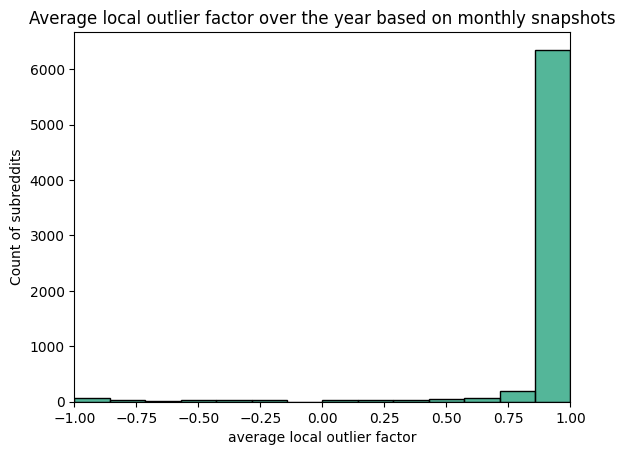

<Figure size 640x480 with 0 Axes>

In [23]:
ax = sns.histplot(data=lof_tracking_df, x=lof_avg_col)
ax.set(ylabel="Count of subreddits", title = f"Average local outlier factor over the year based on monthly snapshots")
plt.xlim(-1, 1)
plt.show()
plt.clf()

In [24]:
# Is there an associate between a subreddit typically being an outlier with its nearest neighbors changing frequently? 
lof_jaccard_df = pd.merge(lof_tracking_df, jaccard_similarity_tracking_df, on="subreddit", how="left")
print(lof_jaccard_df.shape)
display(lof_jaccard_df)

(6950, 39)


,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
0,ILoveMyReplika,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{french_nude, LockdownSceptics, SBARRF, EIDL50...",0.081081,"{Rockbot, TheOakShack, Kerddit, PornVideos_, M...",0.081081,"{hogwartswerewolvesB, cromunity, AvakinOfficia...",0.081081,"{Kerddit, Pocket7Games, InTheGloaming, crimson...",0.111111,0.075475,0.052737
1,SweNsfw,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{DadWouldBeProud, BonerAlert, PetiteNSFW, Maki...",0.142857,"{DadWouldBeProud, BonerAlert, girlsmasturbatin...",0.176471,"{DadWouldBeProud, JizzedToThiss, LipsThatGrip,...",0.142857,"{DadWouldBeProud, assinthong, slutwife, fuckdo...",0.250000,0.108582,0.062749
2,NYr4r,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{MalesMasturbating, weeklysportsfeed, ariheads...",0.025641,"{NFTmarket, AwaitingCum, RealAhegao, ForeverAl...",0.025641,"{bottomsfordaddy, RedditorCum, Musk4Musk, boyp...",0.000000,"{CrimeInTheD, pillhead, drugsarebeautiful, ebo...",0.000000,0.009324,0.012937
3,upvote,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{OnlyFansBrunette, KarmaFarming4Pros, karma, F...",0.333333,"{Onlyfanssmallgirls, AllCryptoBets, dxm, ItsPo...",0.142857,"{armpitvoyeur, IndianTeenagers, NSFWGirl, Dirt...",0.081081,"{OnlyFans101BustyBabes, KarmaFarming4Pros, Onl...",0.111111,0.155577,0.071559
4,Sexsells,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{Slutsofonlyfans, SluttyOnlyfans, OnlyFansBrun...",0.379310,"{OnlyFansBusty, Slutsofonlyfans, onlyfanshotte...",0.333333,"{onlyfanshottest, Slutsofonlyfans, PantiesCraz...",0.290323,"{OnlyFansBusty, PantiesCraze, OnlyFansBlonde, ...",0.379310,0.281531,0.059642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,Flyers,1,1,1,1,1,1,1,1,1,...,"{PhillyUnion, ColoradoAvalanche, NFCEastMemeWa...",0.428571,"{ColoradoAvalanche, NFCEastMemeWar, SanJoseSha...",0.600000,"{ColoradoAvalanche, wildhockey, CalgaryFlames,...",0.538462,"{DallasStars, hockeygoalies, newjersey, philli...",0.481481,0.465882,0.082102
6946,Foodforthought,1,1,1,1,1,1,1,1,1,...,"{economy, LateStageCapitalism, PoliticalDiscus...",0.428571,"{climate, worldnews, inthenews, geopolitics, H...",0.290323,"{moderatepolitics, climate, inthenews, urbanpl...",0.290323,"{CredibleDefense, TheMotte, inthenews, geopoli...",0.290323,0.323428,0.096110
6947,victoria2,1,1,1,1,1,1,1,1,1,...,"{hoi4modding, eu4, imaginarymaps, ParadoxExtra...",0.666667,"{hoi4modding, eu4, imaginarymaps, ParadoxExtra...",0.600000,"{hoi4modding, eu4, imaginarymaps, ParadoxExtra...",0.600000,"{Stellaris, hoi4modding, eu4, imaginarymaps, P...",0.538462,0.677553,0.092131
6948,Military,1,1,1,1,1,1,1,1,1,...,"{WarplanePorn, navy, QualityTacticalGear, nati...",0.481481,"{WarplanePorn, navy, QualityTacticalGear, nati...",0.538462,"{WarplanePorn, CredibleDefense, navy, QualityT...",0.538462,"{WarplanePorn, CredibleDefense, LessCredibleDe...",0.428571,0.540075,0.051628


In [25]:
fig = px.scatter(lof_jaccard_df, x=js_avg_col, y=lof_avg_col, hover_data=["subreddit"])
fig.show()


# Nearest Neighbors of Subreddits over Time 

In order to build the community2vec models, we kept the top 10K subreddits in each month by number of comments posted. In the community2vec model of a given month, you can retrieve the set of any number of nearest neighbors for a particular subreddit, then compare how that set changes from one month to the next. The change in sets of nearest neighbors can be measured using the [Jaccard Similarity](https://en.wikipedia.org/wiki/Jaccard_index) of the top subreddits between each month. Let $S_1$ and $S_2$ be the top 10K subreddits for months 1 and 2 respectively, then the similarity and diversity of top subreddits between those months is $\frac{|S_1 \cap S_2|}{|S_1 \cup S_2|}$.
The closer to 1 the values are, the more similar the nearest neighbors are between those two months. 

10 nearest neighbors of r/trans


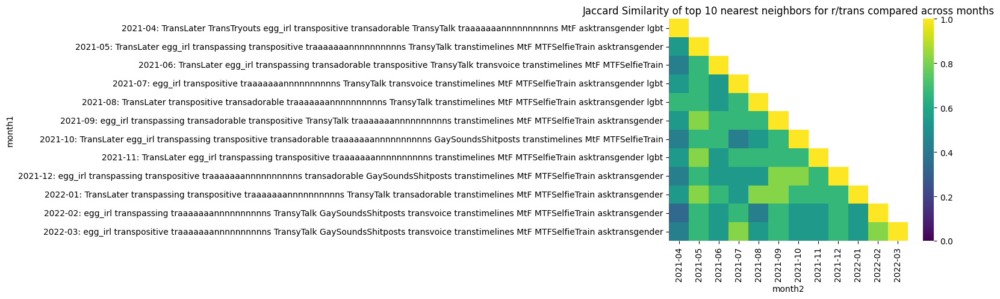

10 nearest neighbors of r/antiwork


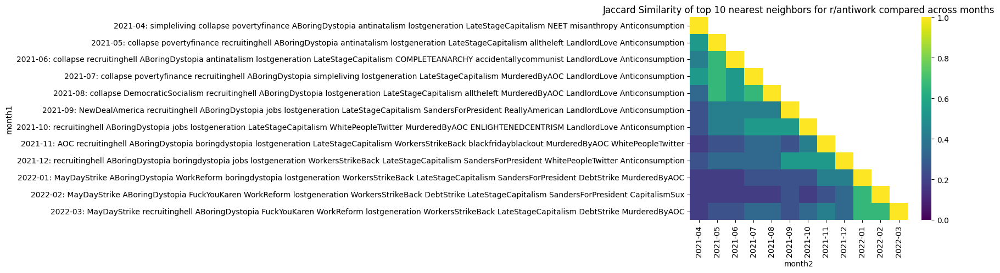

10 nearest neighbors of r/WorkReform


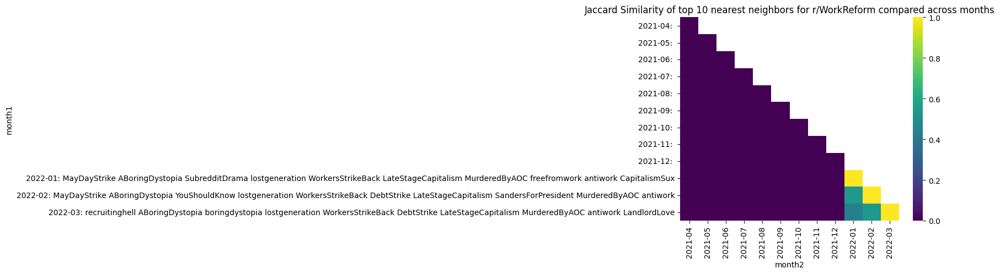

10 nearest neighbors of r/AskReddit


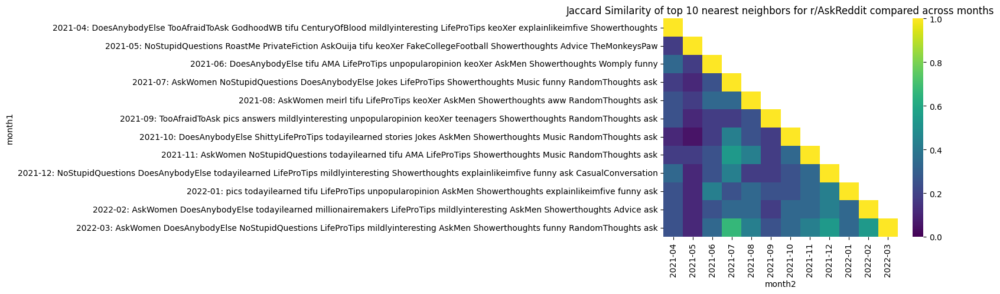

10 nearest neighbors of r/IdiotsInCars


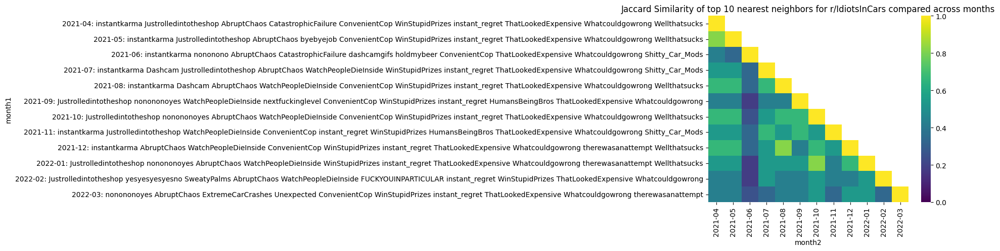

10 nearest neighbors of r/wallstreetbets


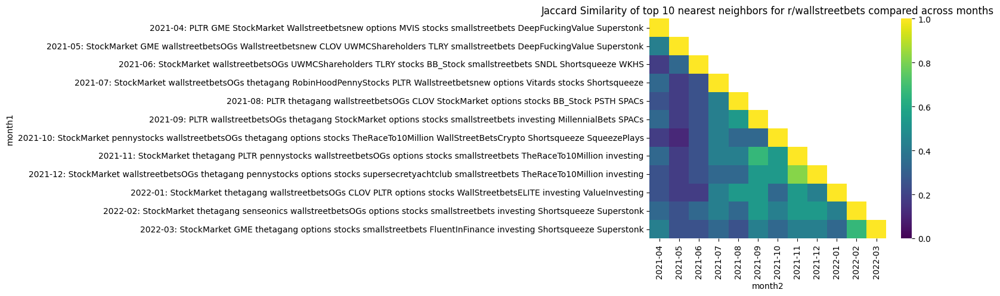

10 nearest neighbors of r/vaxxhappened


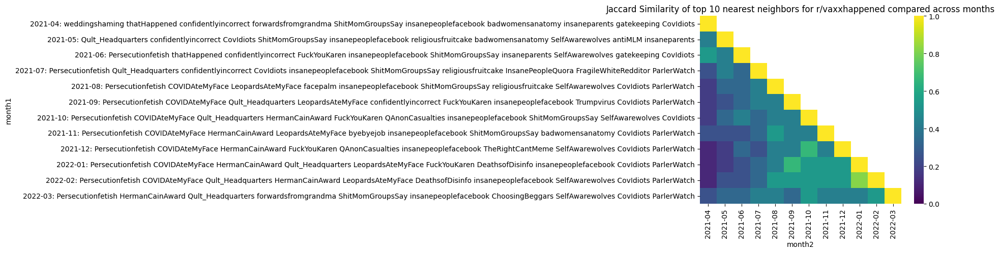

10 nearest neighbors of r/PublicFreakout


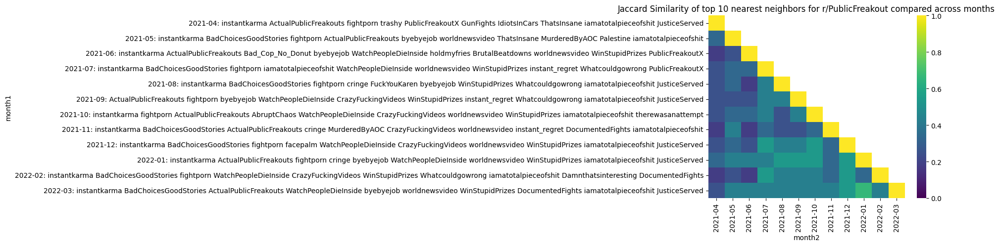

10 nearest neighbors of r/ActualPublicFreakouts


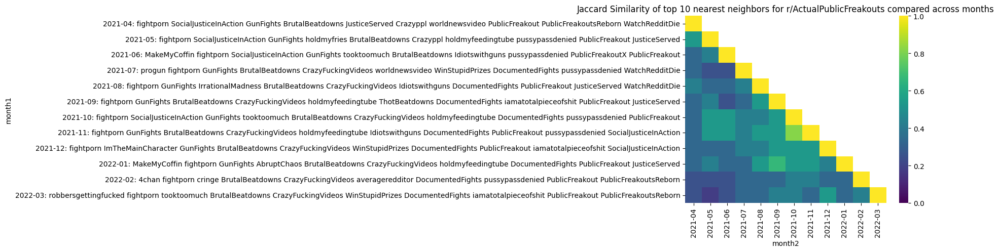

10 nearest neighbors of r/TheRedPill


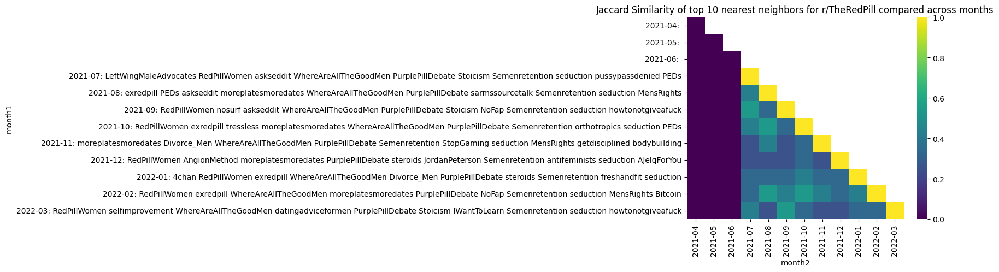

10 nearest neighbors of r/dating_advice


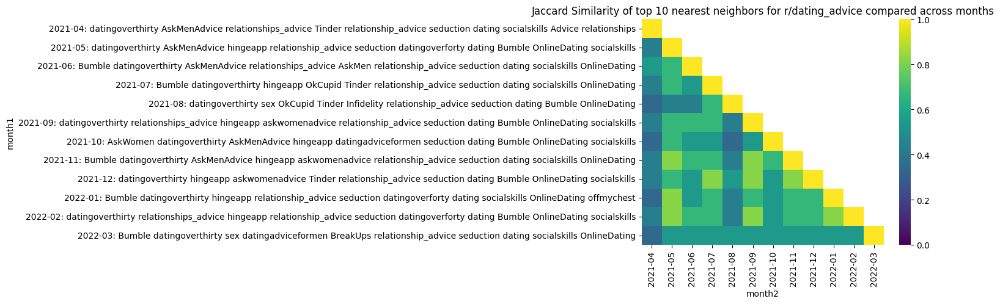

10 nearest neighbors of r/democrats


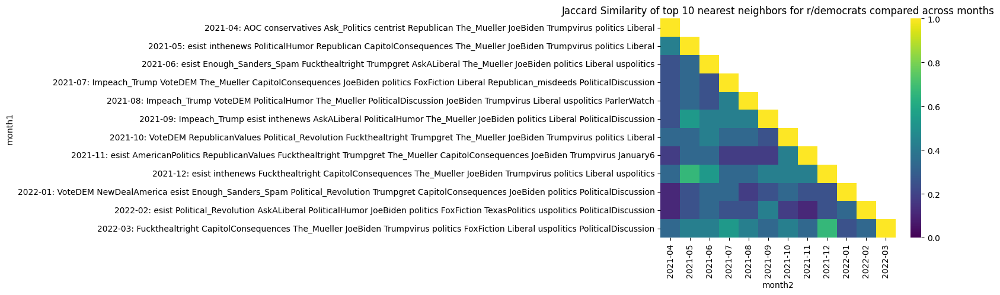

10 nearest neighbors of r/Conservative


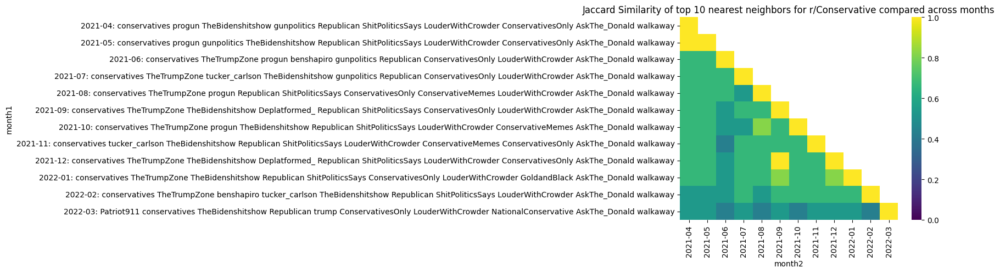

10 nearest neighbors of r/conservatives


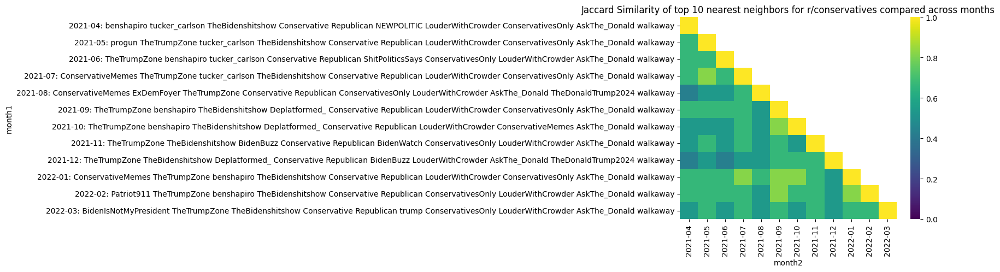

10 nearest neighbors of r/AskThe_Donald


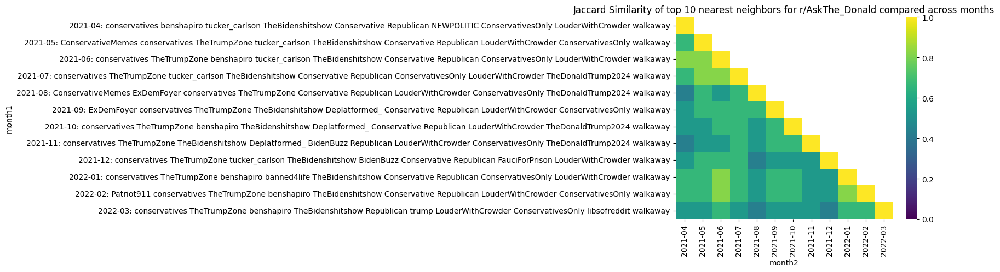

10 nearest neighbors of r/running


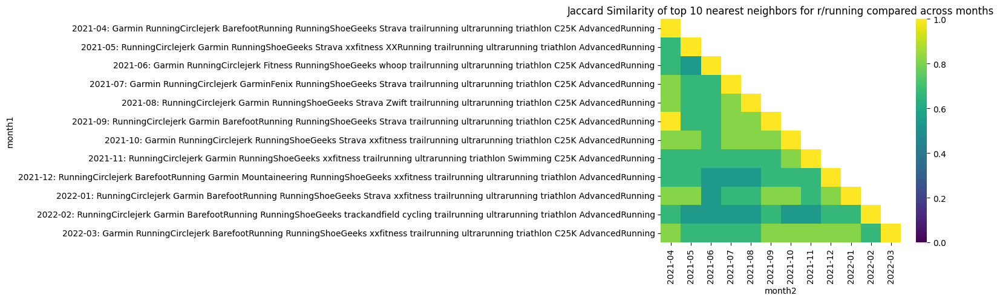

10 nearest neighbors of r/teenagers


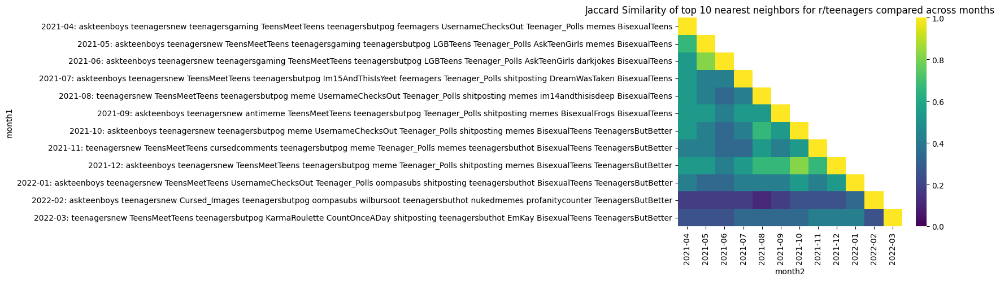

10 nearest neighbors of r/LeopardsAteMyFace


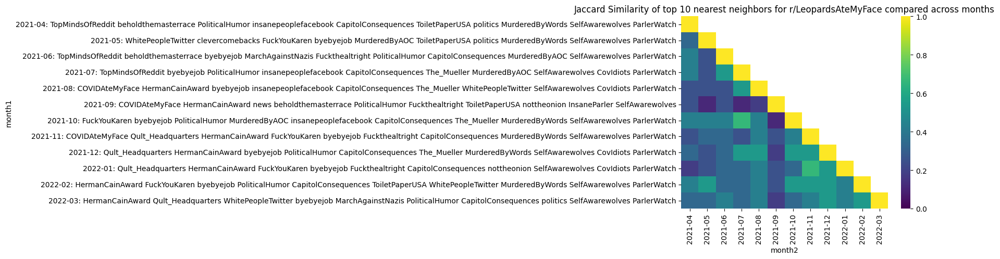

10 nearest neighbors of r/GME


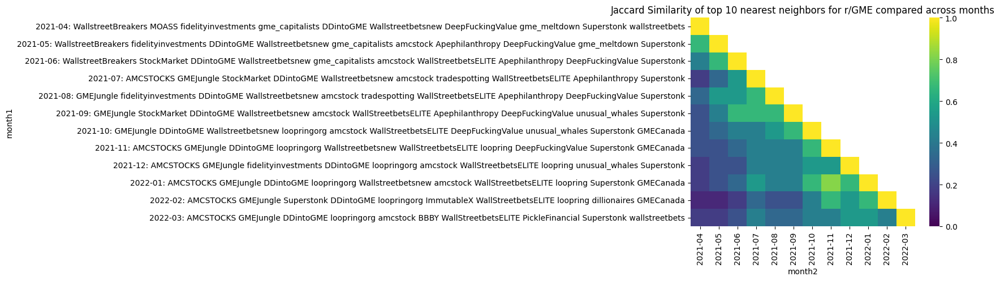

10 nearest neighbors of r/de


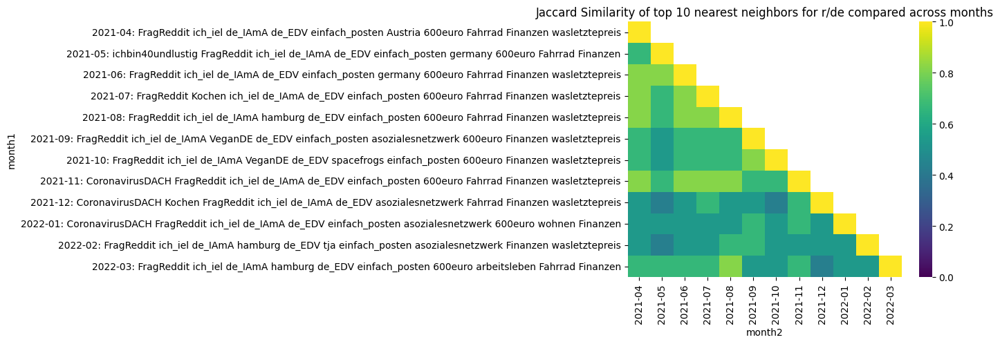

10 nearest neighbors of r/brasil


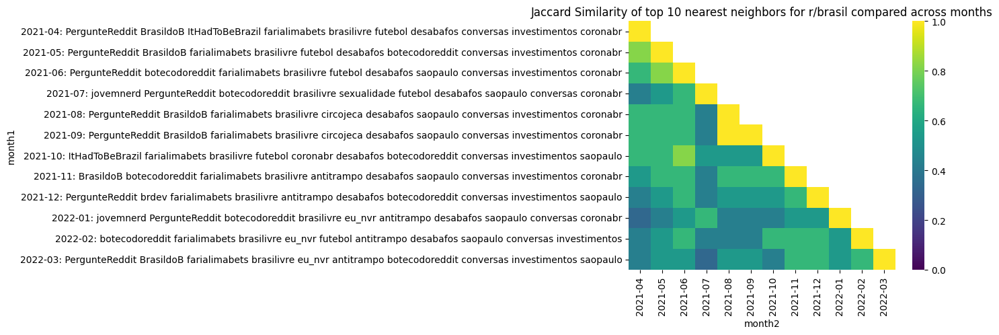

10 nearest neighbors of r/portugueses


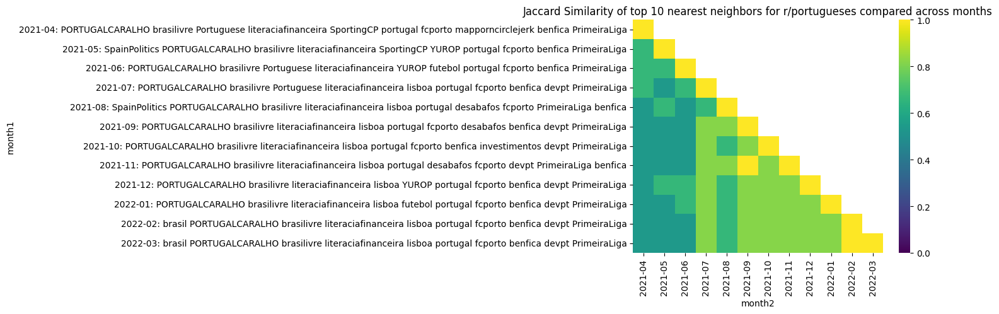

10 nearest neighbors of r/TheGamerLounge


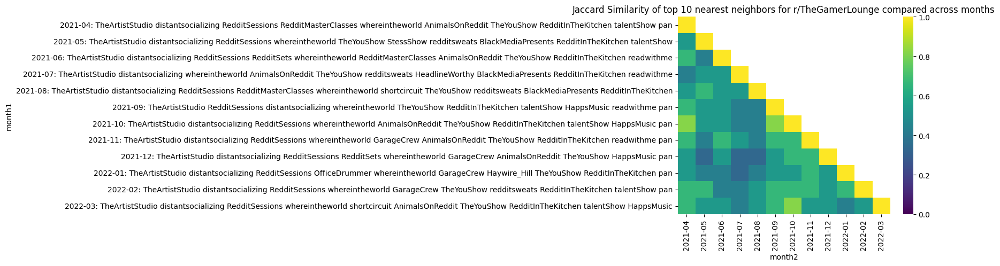

10 nearest neighbors of r/TheYouShow


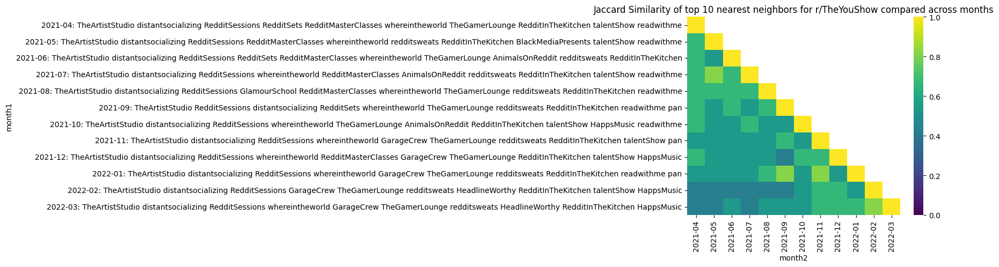

20 nearest neighbors of r/trans


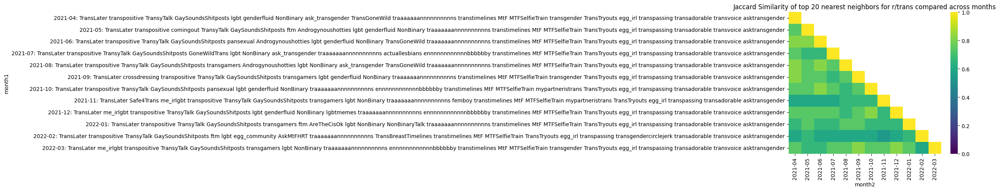

20 nearest neighbors of r/antiwork


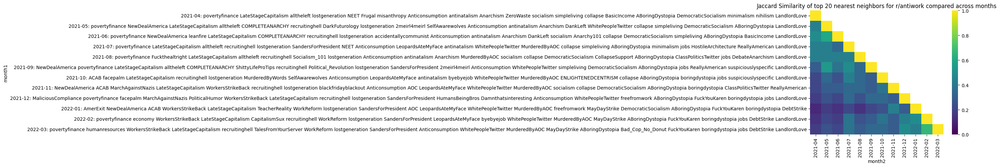

20 nearest neighbors of r/WorkReform


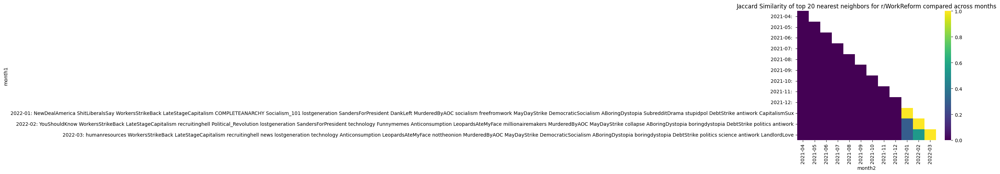

20 nearest neighbors of r/AskReddit


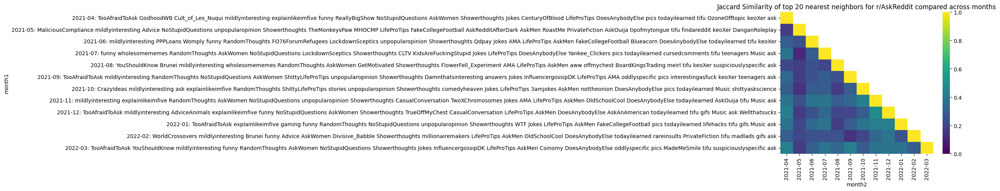

20 nearest neighbors of r/IdiotsInCars


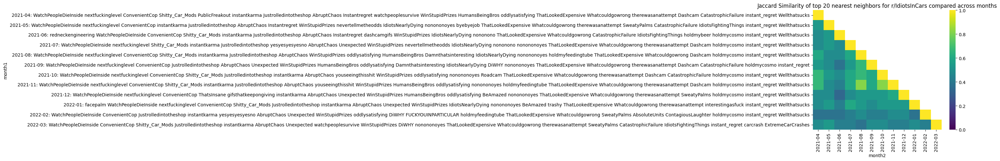

20 nearest neighbors of r/wallstreetbets


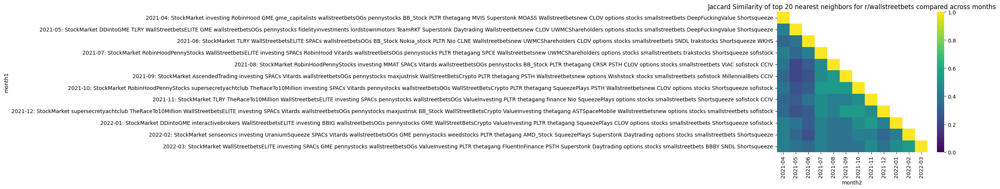

20 nearest neighbors of r/vaxxhappened


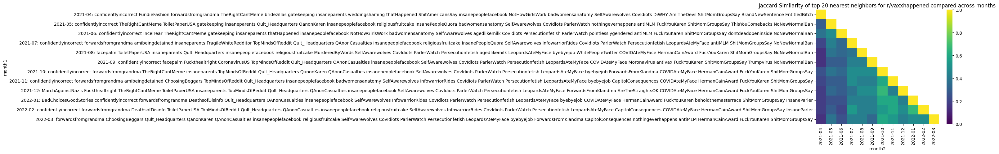

20 nearest neighbors of r/PublicFreakout


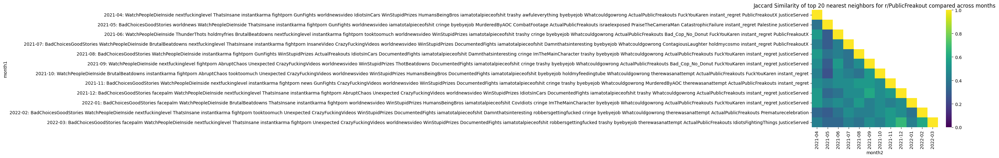

20 nearest neighbors of r/ActualPublicFreakouts


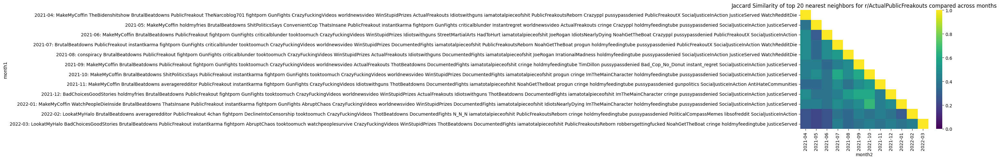

20 nearest neighbors of r/TheRedPill


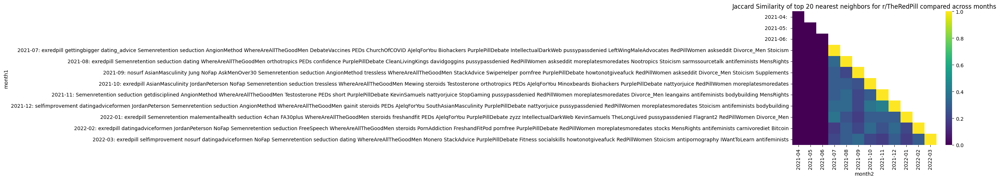

20 nearest neighbors of r/dating_advice


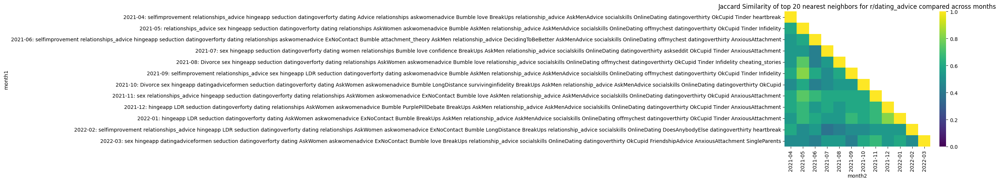

20 nearest neighbors of r/democrats


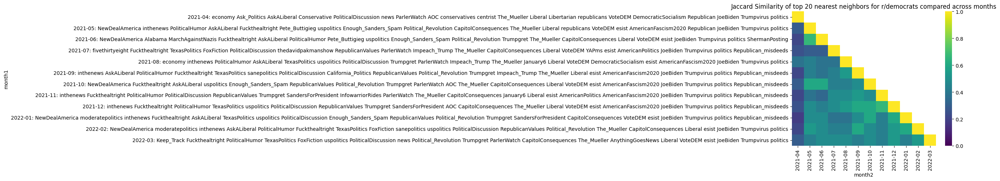

20 nearest neighbors of r/Conservative


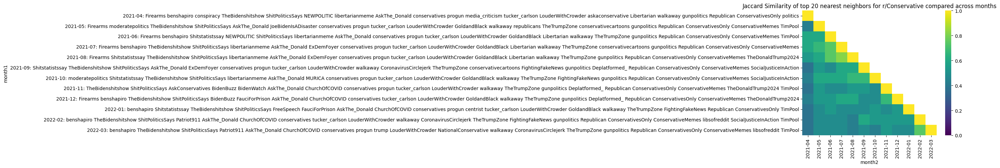

20 nearest neighbors of r/conservatives


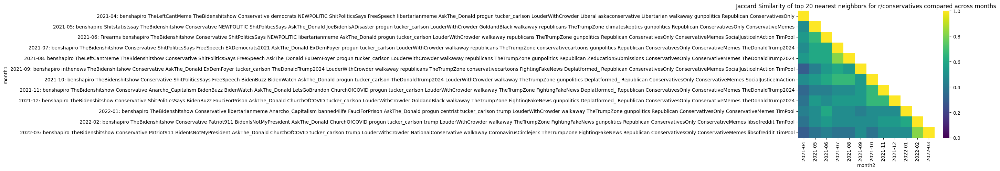

20 nearest neighbors of r/AskThe_Donald


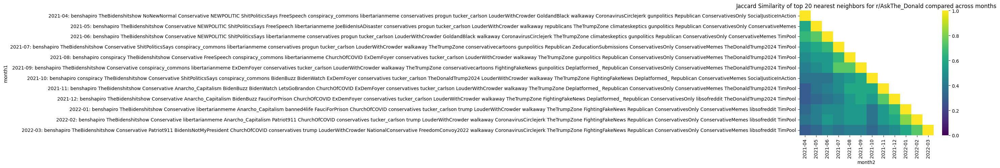

20 nearest neighbors of r/running


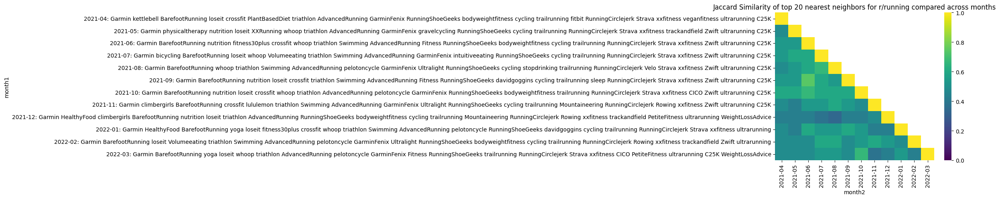

20 nearest neighbors of r/teenagers


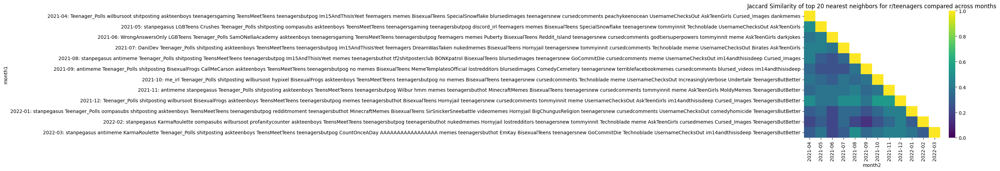

20 nearest neighbors of r/LeopardsAteMyFace


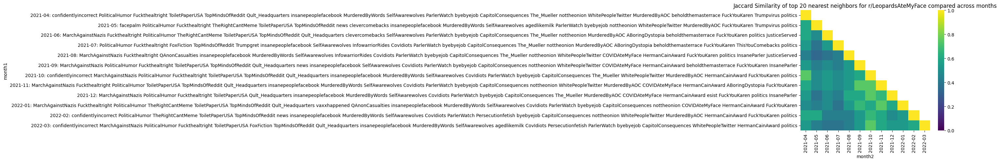

20 nearest neighbors of r/GME


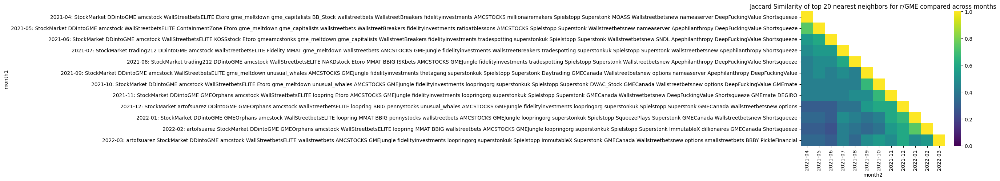

20 nearest neighbors of r/de


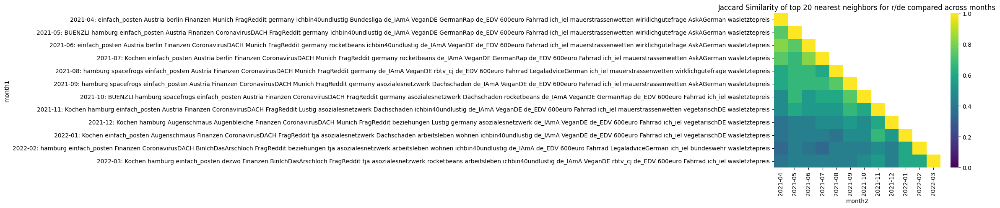

20 nearest neighbors of r/brasil


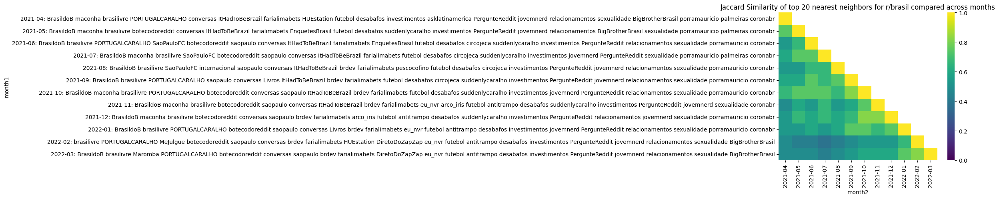

20 nearest neighbors of r/portugueses


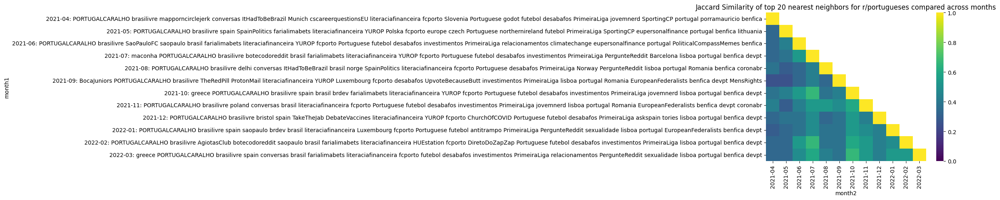

20 nearest neighbors of r/TheGamerLounge


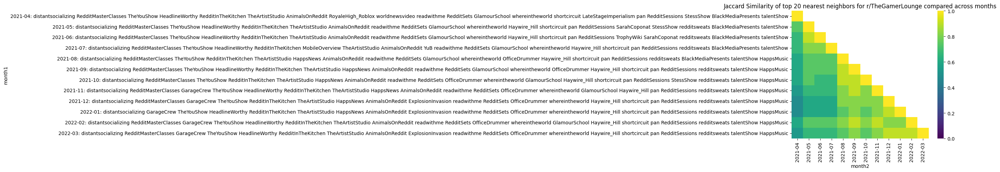

20 nearest neighbors of r/TheYouShow


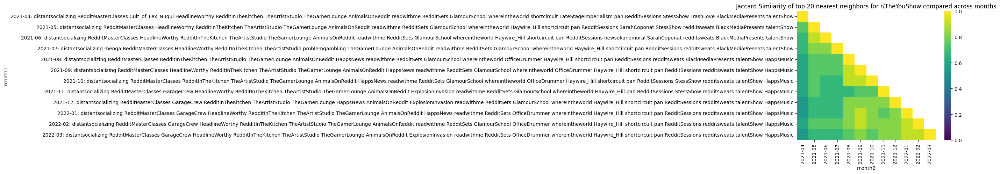

<Figure size 640x480 with 0 Axes>

In [26]:


# Let's look at some specific subreddits
interesting_subreddits = ["trans", "antiwork", "WorkReform", "AskReddit", "IdiotsInCars", "wallstreetbets", "vaxxhappened", "PublicFreakout", "ActualPublicFreakouts", "TheRedPill", "dating_advice", "democrats", "Conservative", "conservatives", "AskThe_Donald", "running", "teenagers", "LeopardsAteMyFace", "GME", "de", "brasil", "portugueses", "TheGamerLounge", "TheYouShow"]


for n in [10, 20]:
    for subreddit in interesting_subreddits:
        subreddit_comp_results = list()
        print(f"{n} nearest neighbors of r/{subreddit}")
        tick_labels = list()
        for i, month1_label in enumerate(MONTHS):
            c2v_model = C2V_MODELS[i]
            topn_nn = set(c2v_model.get_nearest_neighbors(subreddit, n))
            subreddit_comp_results.append((month1_label, topn_nn))
            tick_labels.append(month1_label + ": " + " ".join(topn_nn))

        subreddit_comp_df = pd.DataFrame.from_records(subreddit_comp_results, columns=["month1", "month1_subreddits"])
        subreddit_comp_df_right = subreddit_comp_df.copy().rename(columns={"month1": "month2", "month1_subreddits": "month2_subreddits"})
        merged = pd.merge(subreddit_comp_df, subreddit_comp_df_right, how="cross")
        
        merged["jaccard_similarity"] = merged.apply(lambda x: get_jaccard_similarity(x["month1_subreddits"], x["month2_subreddits"]), axis=1)
        pivot_table = merged.pivot(index = "month1", columns = "month2", values = "jaccard_similarity")
        mask = np.triu(np.ones_like(pivot_table, dtype=bool), 1)
        heatmap = sns.heatmap(pivot_table, vmin=0, vmax=1, yticklabels= tick_labels, mask = mask, cmap="viridis").set_title(f"Jaccard Similarity of top {n} nearest neighbors for r/{subreddit} compared across months")
        fig = heatmap.get_figure()
        plt.show()
        fig.savefig(VIZ_PATH / f"{n}_{subreddit}.png", bbox_inches="tight")
        plt.clf()


        